In [77]:
import pandas as pd 
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from patsy import dmatrices
%matplotlib inline 
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.tree import export_graphviz
import graphviz
import seaborn as sb
import collections
from collections import OrderedDict
import warnings
warnings.filterwarnings(action='ignore')

## Import dataset

In [2]:
olympics = pd.read_csv('athlete_events.csv')
noc = pd.read_csv('noc_regions.csv')

In [3]:
print("Athletes and Events data -  rows:", olympics.shape[0]," columns:", olympics.shape[1])
print("NOC Regions data -  rows:", noc.shape[0]," columns:", noc.shape[1])

Athletes and Events data -  rows: 271116  columns: 15
NOC Regions data -  rows: 230  columns: 3


In [4]:
print("Athlete and Events info: ")
olympics.info()

Athlete and Events info: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 15 columns):
ID        271116 non-null int64
Name      271116 non-null object
Sex       271116 non-null object
Age       261642 non-null float64
Height    210945 non-null float64
Weight    208241 non-null float64
Team      271116 non-null object
NOC       271116 non-null object
Games     271116 non-null object
Year      271116 non-null int64
Season    271116 non-null object
City      271116 non-null object
Sport     271116 non-null object
Event     271116 non-null object
Medal     39783 non-null object
dtypes: float64(3), int64(2), object(10)
memory usage: 31.0+ MB


In [5]:
print("NOC regions info: ")
noc.info()

NOC regions info: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 230 entries, 0 to 229
Data columns (total 3 columns):
NOC       230 non-null object
region    227 non-null object
notes     21 non-null object
dtypes: object(3)
memory usage: 5.5+ KB


## Separating the Summer and Winter Olympics

In [6]:
summerOl = olympics[olympics["Season"] == "Summer"]
summerOl=summerOl.sort_values(by='Year', ascending=True)
summerOl.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
201803,101352,George Stuart Robertson,M,23.0,NaN,NaN,Great Britain,GBR,1896 Summer,1896,Summer,Athina,Tennis,Tennis Men's Singles,NaN
123038,62185,Georgios Koletis,M,NaN,NaN,NaN,Greece,GRE,1896 Summer,1896,Summer,Athina,Cycling,Cycling Men's 100 kilometres,Silver
123037,62185,Georgios Koletis,M,NaN,NaN,NaN,Greece,GRE,1896 Summer,1896,Summer,Athina,Cycling,"Cycling Men's 10,000 metres",NaN
116776,59090,Alexandros Khalkokondylis,M,NaN,171.0,64.0,Greece,GRE,1896 Summer,1896,Summer,Athina,Athletics,Athletics Men's 100 metres,NaN
116777,59090,Alexandros Khalkokondylis,M,NaN,171.0,64.0,Greece,GRE,1896 Summer,1896,Summer,Athina,Athletics,Athletics Men's Long Jump,NaN


In [7]:
winterOl = olympics[olympics["Season"] == "Winter"]
winterOl=winterOl.sort_values(by='Year', ascending=True)
winterOl.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
176120,88549,Harald Johannes kern,M,26.0,NaN,NaN,Norway,NOR,1924 Winter,1924,Winter,Chamonix,Nordic Combined,Nordic Combined Men's Individual,NaN
177217,89099,Ragnar Omtvedt,M,33.0,NaN,NaN,United States,USA,1924 Winter,1924,Winter,Chamonix,Cross Country Skiing,Cross Country Skiing Men's 18 kilometres,NaN
258613,129491,Theresa Weld-Blanchard (-Barnes),F,30.0,NaN,NaN,United States,USA,1924 Winter,1924,Winter,Chamonix,Figure Skating,Figure Skating Women's Singles,NaN
258614,129491,Theresa Weld-Blanchard (-Barnes),F,30.0,NaN,NaN,United States,USA,1924 Winter,1924,Winter,Chamonix,Figure Skating,Figure Skating Mixed Pairs,NaN
258785,129563,Robin Welsh,M,54.0,NaN,NaN,Great Britain,GBR,1924 Winter,1924,Winter,Chamonix,Curling,Curling Men's Curling,Gold


## Cleaning Medals (i.e. replace null with 0 and Bronze/Silver/Gold with 1)

In [8]:
cleanup_medals = {"Medal": {"Gold": 1, "Silver": 1,"Bronze":1}}
summerOl_clean=summerOl.replace(cleanup_medals)
summerOl_clean["Medal"].fillna(0, inplace=True)
summerOl_clean.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
201803,101352,George Stuart Robertson,M,23.0,NaN,NaN,Great Britain,GBR,1896 Summer,1896,Summer,Athina,Tennis,Tennis Men's Singles,0.0
123038,62185,Georgios Koletis,M,NaN,NaN,NaN,Greece,GRE,1896 Summer,1896,Summer,Athina,Cycling,Cycling Men's 100 kilometres,1.0
123037,62185,Georgios Koletis,M,NaN,NaN,NaN,Greece,GRE,1896 Summer,1896,Summer,Athina,Cycling,"Cycling Men's 10,000 metres",0.0
116776,59090,Alexandros Khalkokondylis,M,NaN,171.0,64.0,Greece,GRE,1896 Summer,1896,Summer,Athina,Athletics,Athletics Men's 100 metres,0.0
116777,59090,Alexandros Khalkokondylis,M,NaN,171.0,64.0,Greece,GRE,1896 Summer,1896,Summer,Athina,Athletics,Athletics Men's Long Jump,0.0


In [9]:
winterOl_clean=winterOl.replace(cleanup_medals)
winterOl_clean["Medal"].fillna(0, inplace=True)
winterOl_clean.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
176120,88549,Harald Johannes kern,M,26.0,NaN,NaN,Norway,NOR,1924 Winter,1924,Winter,Chamonix,Nordic Combined,Nordic Combined Men's Individual,0.0
177217,89099,Ragnar Omtvedt,M,33.0,NaN,NaN,United States,USA,1924 Winter,1924,Winter,Chamonix,Cross Country Skiing,Cross Country Skiing Men's 18 kilometres,0.0
258613,129491,Theresa Weld-Blanchard (-Barnes),F,30.0,NaN,NaN,United States,USA,1924 Winter,1924,Winter,Chamonix,Figure Skating,Figure Skating Women's Singles,0.0
258614,129491,Theresa Weld-Blanchard (-Barnes),F,30.0,NaN,NaN,United States,USA,1924 Winter,1924,Winter,Chamonix,Figure Skating,Figure Skating Mixed Pairs,0.0
258785,129563,Robin Welsh,M,54.0,NaN,NaN,Great Britain,GBR,1924 Winter,1924,Winter,Chamonix,Curling,Curling Men's Curling,1.0


## Find out the number of teams for each country

In [10]:
print(olympics.loc[:, ['NOC', 'Team']].drop_duplicates()['NOC'].value_counts())

FRA    160
USA     97
GBR     96
SWE     52
NOR     46
GER     43
ITA     36
CAN     32
DEN     29
GRE     29
NED     27
FIN     24
AUS     23
POR     22
BEL     22
SUI     18
ARG     18
URS     18
JPN     15
BRA     13
AUT     12
ESP     11
BAH     10
HUN     10
MEX      9
RSA      9
NZL      8
CUB      7
IRL      7
RUS      7
      ... 
CAY      1
VIN      1
KEN      1
LES      1
BDI      1
ALG      1
GEO      1
GEQ      1
LBR      1
CIV      1
JOR      1
TGA      1
BRN      1
PAN      1
TLS      1
TUN      1
KIR      1
SMR      1
CRC      1
BAR      1
LIE      1
VAN      1
GHA      1
ANT      1
NEP      1
ROT      1
MGL      1
SAM      1
COM      1
ARU      1
Name: NOC, Length: 230, dtype: int64


In [11]:
noc.drop('notes', axis = 1 , inplace = True)
noc.rename(columns = {'region':'Country'}, inplace = True)
noc.head()

,NOC,Country
0,AFG,Afghanistan
1,AHO,Curacao
2,ALB,Albania
3,ALG,Algeria
4,AND,Andorra


## Merging of NOC data with events data

In [12]:
olympics_noc = olympics.merge(noc,
                                left_on = 'NOC',
                                right_on = 'NOC',
                                how = 'left')
olympics_noc.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Country
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands


## Do we have NOCs that didnt have a matching country in the master?

In [13]:
olympics_noc.loc[olympics_noc['Country'].isnull(),['NOC', 'Team']].drop_duplicates()

,NOC,Team
578,SGP,Singapore
6267,ROT,Refugee Olympic Athletes
44376,SGP,June Climene
61080,UNK,Unknown
64674,TUV,Tuvalu
80986,SGP,Rika II
108582,SGP,Singapore-2
235895,SGP,Singapore-1


## Replace missing Teams by these values
1. SGP - Singapore
2. ROT - Refugee Olympic Athletes
3. UNK - Unknown
4. TUV - Tuvalu

In [14]:
olympics_noc['Country'] = np.where(olympics_noc['NOC']=='SGP', 'Singapore', olympics_noc['Country'])
olympics_noc['Country'] = np.where(olympics_noc['NOC']=='ROT', 'Refugee Olympic Athletes', olympics_noc['Country'])
olympics_noc['Country'] = np.where(olympics_noc['NOC']=='UNK', 'Unknown', olympics_noc['Country'])
olympics_noc['Country'] = np.where(olympics_noc['NOC']=='TUV', 'Tuvalu', olympics_noc['Country'])

## Put these values from Country into Team

In [15]:
olympics_noc.drop('Team', axis = 1, inplace = True)
olympics_noc.rename(columns = {'Country': 'Team'}, inplace = True)

In [16]:
olympics_noc.head()

,ID,Name,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Sport,Event,Medal,Team
0,1,A Dijiang,M,24.0,180.0,80.0,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China
1,2,A Lamusi,M,23.0,170.0,60.0,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands


## Missing data

In [17]:
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data(olympics_noc)

,Total,Percent
Medal,231333,85.326207
Weight,62875,23.191180
Height,60171,22.193821
Age,9474,3.494445
Team,0,0.000000
Event,0,0.000000
Sport,0,0.000000
City,0,0.000000
Season,0,0.000000
Year,0,0.000000


## Get rid of rows with missing data

In [18]:
cleanolympic = olympics_noc.dropna(subset = ['Age', 'Height', 'Weight', 'Medal'])

In [19]:
cleanolympic.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30181 entries, 40 to 271103
Data columns (total 15 columns):
ID        30181 non-null int64
Name      30181 non-null object
Sex       30181 non-null object
Age       30181 non-null float64
Height    30181 non-null float64
Weight    30181 non-null float64
NOC       30181 non-null object
Games     30181 non-null object
Year      30181 non-null int64
Season    30181 non-null object
City      30181 non-null object
Sport     30181 non-null object
Event     30181 non-null object
Medal     30181 non-null object
Team      30181 non-null object
dtypes: float64(3), int64(2), object(10)
memory usage: 3.7+ MB


In [20]:
cleanolympic.head()

,ID,Name,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Sport,Event,Medal,Team
40,16,Juhamatti Tapio Aaltonen,M,28.0,184.0,85.0,FIN,2014 Winter,2014,Winter,Sochi,Ice Hockey,Ice Hockey Men's Ice Hockey,Bronze,Finland
41,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Individual All-Around,Bronze,Finland
42,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Team All-Around,Gold,Finland
44,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Horse Vault,Gold,Finland
48,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Pommelled Horse,Gold,Finland


# Basic Visualisation and Exploration of data

## Countries' Participation in the Olympics

In [21]:
tmp = olympics_noc.groupby(['Team'])['Year'].nunique()
df = pd.DataFrame(data={'Editions': tmp.values}, index=tmp.index).reset_index()
df.head(2)

,Team,Editions
0,Afghanistan,14
1,Albania,11


In [22]:
trace = go.Choropleth(
            locations = df['Team'],
            locationmode='country names',
            z = df['Editions'],
            text = df['Team'],
            autocolorscale =False,
            reversescale = True,
            colorscale = 'rainbow',
            marker = dict(
                line = dict(
                    color = 'rgb(0,0,0)',
                    width = 0.5)
            ),
            colorbar = dict(
                title = 'Editions',
                tickprefix = '')
        )

data = [trace]
layout = go.Layout(
    title = 'Olympic Countries',
    geo = dict(
        showframe = True,
        showlakes = False,
        showcoastlines = True,
        projection = dict(
            type = 'natural earth'
        )
    )
)

fig = dict( data=data, layout=layout )
iplot(fig)


In [23]:
tmp = olympics_noc.groupby(['Team', 'Season'])['Year'].nunique()
df = pd.DataFrame(data={'Editions': tmp.values}, index=tmp.index).reset_index()
df.head()

,Team,Season,Editions
0,Afghanistan,Summer,14
1,Albania,Summer,8
2,Albania,Winter,3
3,Algeria,Summer,13
4,Algeria,Winter,3


In [24]:
print("Number of Summer Olympics data points:", len(summerOl))
print("Number of Winter Olympics data points:", len(winterOl))

Number of Summer Olympics data points: 222552
Number of Winter Olympics data points: 48564


In [25]:
print("Number of Summer Olympics held:", len(summerOl["Year"].unique()))
print("Number of Winter Olympics held:", len(winterOl["Year"].unique()))

Number of Summer Olympics held: 29
Number of Winter Olympics held: 22


In [26]:
dfS = df[df['Season']=='Summer']; dfW = df[df['Season']=='Winter']

def draw_map(dataset, title, colorscale, reversescale=False):
    trace = go.Choropleth(
                locations = dataset['Team'],
                locationmode='country names',
                z = dataset['Editions'],
                text = dataset['Team'],
                autocolorscale =False,
                reversescale = reversescale,
                colorscale = colorscale,
                marker = dict(
                    line = dict(
                        color = 'rgb(0,0,0)',
                        width = 0.5)
                ),
                colorbar = dict(
                    title = 'Editions',
                    tickprefix = '')
            )
    data = [trace]
    layout = go.Layout(
        title = title,
        geo = dict(
            showframe = True,
            showlakes = False,
            showcoastlines = True,
            projection = dict(
                type = 'orthographic'
            )
        )
    )
    fig = dict( data=data, layout=layout )
    iplot(fig)
    
draw_map(dfS, 'Olympic countries (Summer games)', "Reds")

In [27]:
draw_map(dfW, 'Olympic countries (Winter games)', "Blues", True)

The winter olympics are much less popular and we find that warmer countries tend to participate less - which makes sense intuitively. The lack of participation can also be linked with the history of colonialism and political turmoil - can be inferred by the overall 'Olympic Countries' map.

## Country-wise Wins

In [28]:
medalnoc_S=summerOl_clean.groupby(['NOC','Year'], as_index=False)['Medal'].sum()
medalnoc_S.head()

,NOC,Year,Medal
0,AFG,1936,0.0
1,AFG,1948,0.0
2,AFG,1956,0.0
3,AFG,1960,0.0
4,AFG,1964,0.0


In [29]:
def plot_S (year):
    medals=medalnoc_S.loc[(medalnoc_S['Year'])== year]
    medals=medals.reset_index()
    medals=medals.nlargest(30, 'Medal')
    medals.plot.bar(x='NOC', y='Medal',figsize=(15, 5), title="Top 30 Countries (Summer Olympics): " + str(year))

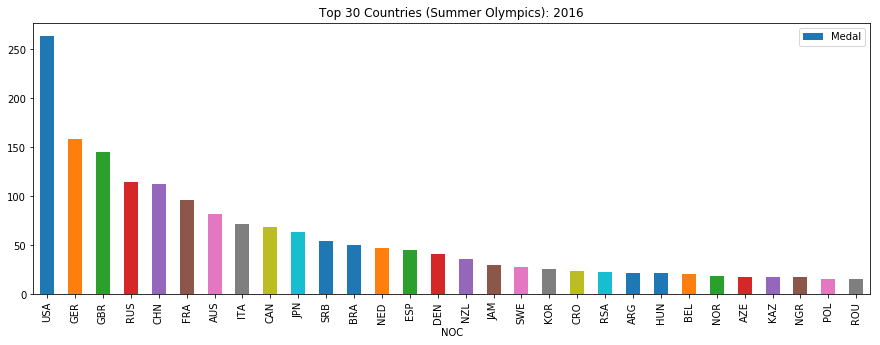

In [30]:
plot_S(2016)

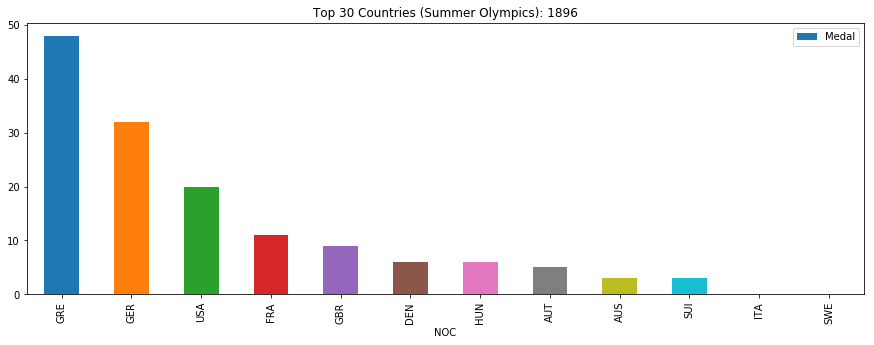

In [31]:
plot_S(1896)

In [32]:
medalnoc_W=winterOl_clean.groupby(['NOC','Year'], as_index=False)['Medal'].sum()
medalnoc_W.head()

,NOC,Year,Medal
0,AHO,1988,0.0
1,AHO,1992,0.0
2,ALB,2006,0.0
3,ALB,2010,0.0
4,ALB,2014,0.0


In [33]:
def plot_W (year):
    medals=medalnoc_W.loc[(medalnoc_W['Year'])== year]
    medals=medals.reset_index()
    medals=medals.nlargest(30, 'Medal')
    medals.plot.bar(x='NOC', y='Medal',figsize=(15, 5), title="Top 30 Countries (Winter Olympics): " + str(year))

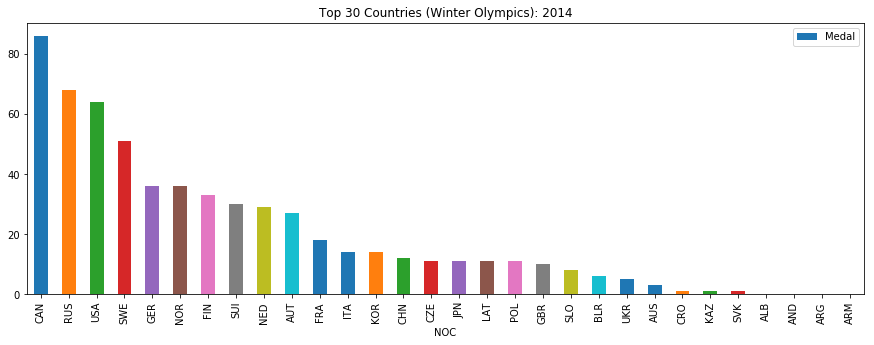

In [34]:
plot_W(2014)

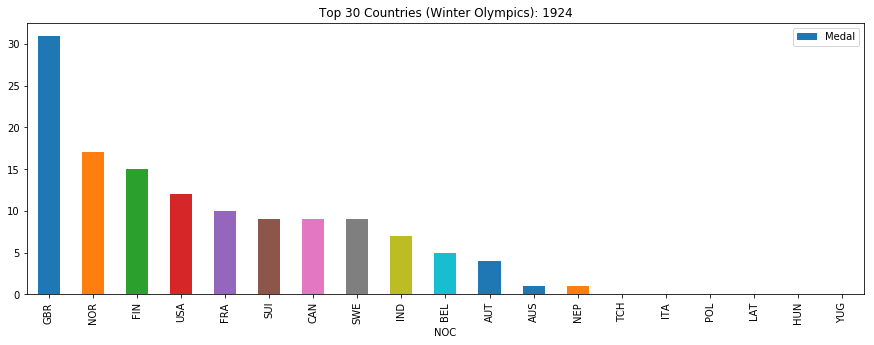

In [35]:
plot_W(1924)

Comparing the initial olympics to that of recent times, it is easy to visulise the difference in terms of participation and wins. 

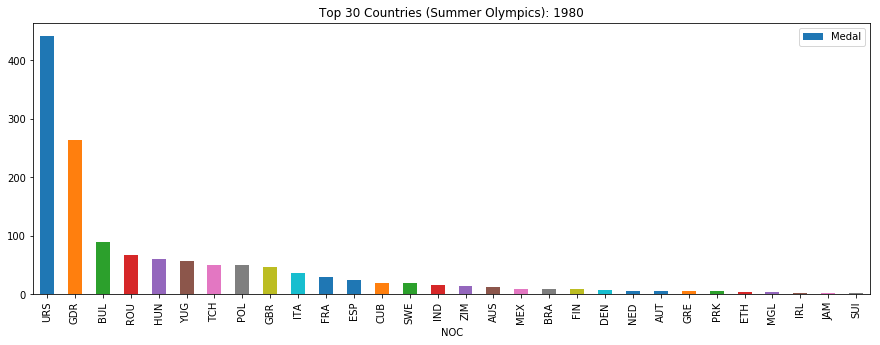

In [36]:
plot_S(1980)

We can also use this plot to find disparities (due to specific world events) in participation and wins for specific years. For example,

Moscow, 1980: Many countries (including the US) boycotted the Summer Olympics in Moscow because of the Soviet invasion of Afghanistan.

## Athlete Participation 

In [37]:
tmp = olympics_noc.groupby(['Year', 'City','Season'])['Sport'].value_counts()
df = pd.DataFrame(data={'Athletes': tmp.values}, index=tmp.index).reset_index()
df_S = df[df['Season']=='Summer']
df_S.head()

,Year,City,Season,Sport,Athletes
0,1896,Athina,Summer,Athletics,106
1,1896,Athina,Summer,Gymnastics,97
2,1896,Athina,Summer,Shooting,65
3,1896,Athina,Summer,Cycling,41
4,1896,Athina,Summer,Tennis,23


In [38]:
piv = pd.pivot_table(df_S, values="Athletes",index=["Year"], columns=["Sport"], fill_value=0)
m = piv.values

In [39]:
trace = go.Heatmap(z = m, y= list(piv.index), x=list(piv.columns),colorscale='Reds',reversescale=False)
data=[trace]
layout = dict(title = "Number of athletes per year and sport (Summer Olympics)",
              xaxis = dict(title = 'Sport',
                        showticklabels=True,
                           tickangle = 45,
                        tickfont=dict(
                                size=10,
                                color='black'),
                          ),
              yaxis = dict(title = 'Year', 
                        showticklabels=True, 
                        tickfont=dict(
                            size=10,
                            color='black'),
                      ), 
              hovermode = 'closest',
              showlegend=False,
                  width=1000,
                  height=800,
             )
fig = dict(data=data, layout=layout)
iplot(fig, filename='labelled-heatmap')

In [40]:
df_W = df[df['Season']=='Winter']
df_W.head()

,Year,City,Season,Sport,Athletes
126,1924,Chamonix,Winter,Speed Skating,110
127,1924,Chamonix,Winter,Ice Hockey,82
128,1924,Chamonix,Winter,Cross Country Skiing,74
129,1924,Chamonix,Winter,Bobsleigh,39
130,1924,Chamonix,Winter,Figure Skating,37


In [41]:
piv = pd.pivot_table(df_W, values="Athletes",index=["Year"], columns=["Sport"], fill_value=0)
m = piv.values

In [42]:
trace = go.Heatmap(z = m, y= list(piv.index), x=list(piv.columns),colorscale='Blues',reversescale=True)
data=[trace]
layout = dict(title = "Number of athletes per year and sport (Winter Olympics)",
              xaxis = dict(title = 'Sport',
                        showticklabels=True,
                           tickangle = 30,
                        tickfont=dict(
                                size=8,
                                color='black'),
                          ),
              yaxis = dict(title = 'Year', 
                        showticklabels=True, 
                        tickfont=dict(
                            size=10,
                            color='black'),
                      ), 
              hovermode = 'closest',
              showlegend=False,
                  width=800,
                  height=800,
             )
fig = dict(data=data, layout=layout)
iplot(fig, filename='labelled-heatmap')

We can see: 

- alpinism, croquet and many other sports have been phased out
- sports like badminton and snowboarding are relatively new additions to the Olympics
- there is a general increase in the number athletes competing 

## Height distribution for Athletes, grouped by sex

In [43]:
fem_h = cleanolympic[cleanolympic['Sex']=='F']['Height']
male_h = cleanolympic[cleanolympic['Sex']=='M']['Height']

datafordistploth = [fem_h, male_h]
labelsfordistploth = ['Female Height', 'Male Height']


fig = ff.create_distplot(datafordistploth, labelsfordistploth, show_hist=True, show_rug=True)
fig['layout'].update(title='Athletes Height Distribution Plot')
iplot(fig, filename='dist_only')

## Weight distribution for Athletes, grouped by sex

In [44]:
fem_w = cleanolympic[cleanolympic['Sex']=='F']['Weight']
male_w = cleanolympic[cleanolympic['Sex']=='M']['Weight']

datafordistplotw = [fem_w, male_w]
labelsfordistplotw = ['Female Weight', 'Male Weight']

fig = ff.create_distplot(datafordistplotw, labelsfordistplotw, show_hist=True, show_rug=True)
fig['layout'].update(title='Athletes Weight distribution plot')
iplot(fig, filename='dist_only')

## Age distribution for Athletes, grouped by sex

In [45]:
fem_a = cleanolympic[cleanolympic['Sex']=='F']['Age']
male_a = cleanolympic[cleanolympic['Sex']=='M']['Age']

datafordistplota = [fem_a, male_a]
labelsfordistplota = ['Female Age', 'Male Age']

fig = ff.create_distplot(datafordistplota, labelsfordistplota, show_hist=True, show_rug=True)
fig['layout'].update(title='Athletes Age distribution plot')
iplot(fig, filename='dist_only')

##  Athletes body measurements, grouped by Sex and Sport

In [46]:
tmp = cleanolympic.groupby(['Sport', 'Sex'])['Height', 'Weight', 'Age'].agg('mean')
df1 = pd.DataFrame(tmp).reset_index()
tmp2 = cleanolympic.groupby(['Sport', 'Sex'])['ID'].count()
df2 = pd.DataFrame(tmp2).reset_index()
dataset = df1.merge(df2)

In [47]:
dataset.head()

,Sport,Sex,Height,Weight,Age,ID
0,Alpine Skiing,F,168.255556,64.133333,23.383333,180
1,Alpine Skiing,M,179.247126,81.729885,25.672414,174
2,Archery,F,167.140000,62.360000,24.280000,100
3,Archery,M,179.207547,78.825472,25.273585,106
4,Art Competitions,M,174.000000,75.500000,32.000000,2


## Female

In [48]:
hover_text = []
for index, row in dataset.iterrows():
    hover_text.append(('Sex: {}<br>'+
                       'Sport: {}<br>'
                       'Number of athletes: {}<br>'+
                       'Mean Age: {}<br>'
                       'Mean Height: {}<br>'+
                       'Mean Weight: {}<br>').format(row['Sex'],
                                            row['Sport'],
                                            row['ID'],
                                            round(row['Age'],2), 
                                            round(row['Height'],2),
                                            round(row['Weight'],2)))
dataset['hover_text'] = hover_text

In [49]:
def plot_bubble_chart(dataset,title):
    data = []
    for sport in dataset['Sport']:
        ds = dataset[dataset['Sport']==sport]
        trace = go.Scatter(
            x = ds['Height'],
            y = ds['Weight'],
            name = sport,
            marker=dict(
                symbol='circle',
                sizemode='area',
                sizeref=50,
                size=np.power(ds['Age'],3),
                line=dict(
                    width=2
                ),),
            text = ds['hover_text']
        )
        data.append(trace)

    layout = go.Layout(
        title= title,
        xaxis=dict(
            title='Height [cm]',
            gridcolor='rgb(128, 128, 128)',
            zerolinewidth=1,
            ticklen=1,
            gridwidth=0.5,
            range=[150,200]
        ),
        yaxis=dict(
            title='Weight [kg]',
            gridcolor='rgb(128, 128, 128)',
            zerolinewidth=1,
            ticklen=1,
            gridwidth=0.5,
            range=[45,100]
        ),
        paper_bgcolor='rgb(255,255,255)',
        plot_bgcolor='rgb(254, 254, 254)',
        showlegend=False,
    )
    fig = dict(data = data, layout = layout)
    iplot(fig, filename='athletes_body_measures')
    
dF = dataset[dataset['Sex']=='F']
plot_bubble_chart(dF,'Female athletes height and weight mean - grouped by sport')

The average height is around 170cm and the average weight is around 65kg.

It's also easy to visualise the outliers in terms of body type:
- Basketball
- Gymnastics
- Weightlifting
- Rhythmic Gymnastics

In [50]:
cleanolympicf = cleanolympic[cleanolympic['Sex']=='F']
tmp = cleanolympicf.groupby(['Sport', 'Year'])['Height', 'Weight'].agg('mean')
df1 = pd.DataFrame(tmp).reset_index()
tmp2 = cleanolympic.groupby(['Sport', 'Year'])['ID'].count()
df2 = pd.DataFrame(tmp2).reset_index()
dataset = df1.merge(df2)

In [51]:
# create hover text
hover_text = []
for index, row in dataset.iterrows():
    hover_text.append(('Year: {}<br>'+
                       'Sport: {}<br>'+
                      'Number of athletes: {}<br>'+
                      'Mean Height: {}<br>'+
                      'Mean Weight: {}<br>').format(row['Year'], 
                                            row['Sport'],
                                            row['ID'],
                                            round(row['Height'],2),
                                            round(row['Weight'],2)))
dataset['hover_text'] = hover_text

In [52]:
# create animation for scatterplot
years = (cleanolympic.groupby(['Year'])['Year'].nunique()).index
sports = (cleanolympic.groupby(['Sport'])['Sport'].nunique()).index
# make figure
figure = {
    'data': [],
    'layout': {},
    'frames': []
}

# fill in most of layout
figure['layout']['xaxis'] = {'range': [140, 195], 'title': 'Height'}
figure['layout']['yaxis'] = {'range': [20, 120],'title': 'Weight'}
figure['layout']['hovermode'] = 'closest'
figure['layout']['showlegend'] = False
figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '1920',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]
sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}
# make data
year = 1896
for sport in sports:
    dataset_by_year = dataset[dataset['Year'] == year]
    dataset_by_year_and_season = dataset_by_year[dataset_by_year['Sport'] == sport]

    data_dict = {
        'x': list(dataset_by_year_and_season['Height']),
        'y': list(dataset_by_year_and_season['Weight']),
        'mode': 'markers',
        'text': list(dataset_by_year_and_season['hover_text']),
        'marker': {
            'sizemode': 'area',
            'sizeref': 1,
            'size': list(dataset_by_year_and_season['ID'])
        },
        'name': sport
    }
    figure['data'].append(data_dict)

# make frames
for year in years:
    frame = {'data': [], 'name': str(year)}
    for sport in sports:
        dataset_by_year = dataset[dataset['Year'] == int(year)]
        dataset_by_year_and_season = dataset_by_year[dataset_by_year['Sport'] == sport]

        data_dict = {
            'x': list(dataset_by_year_and_season['Height']),
            'y': list(dataset_by_year_and_season['Weight']),
            'mode': 'markers',
            'text': list(dataset_by_year_and_season['hover_text']),
            'marker': {
                'sizemode': 'area',
                'sizeref': 0.1,
                'size':  list(dataset_by_year_and_season['ID']),
            },
            'name': sport
        }
        frame['data'].append(data_dict)

    figure['frames'].append(frame)
    slider_step = {'args': [
        [year],
        {'frame': {'duration': 300, 'redraw': True},
         'mode': 'immediate',
       'transition': {'duration': 300}}
     ],
     'label': year,
     'method': 'animate'}
    sliders_dict['steps'].append(slider_step)
figure['layout']['sliders'] = [sliders_dict]
iplot(figure)

We can see that:
- the average height has shifted from around 165cm to around 170cm
- the average weight has stayed at about 60kg.
- the athletes' body types have gotten more extreme for specific sports in recent times
- women's participation in the olympics started quite late

## Male

In [ ]:
tmp = cleanolympic.groupby(['Sport', 'Sex'])['Height', 'Weight', 'Age'].agg('mean')
df1 = pd.DataFrame(tmp).reset_index()
tmp2 = cleanolympic.groupby(['Sport', 'Sex'])['ID'].count()
df2 = pd.DataFrame(tmp2).reset_index()
dataset = df1.merge(df2)

hover_text = []
for index, row in dataset.iterrows():
    hover_text.append(('Sex: {}<br>'+
                       'Sport: {}<br>'
                       'Number of athletes: {}<br>'+
                       'Mean Age: {}<br>'
                       'Mean Height: {}<br>'+
                       'Mean Weight: {}<br>').format(row['Sex'],
                                            row['Sport'],
                                            row['ID'],
                                            round(row['Age'],2), 
                                            round(row['Height'],2),
                                            round(row['Weight'],2)))
dataset['hover_text'] = hover_text

def plot_bubble_chart(dataset,title):
    data = []
    for sport in dataset['Sport']:
        ds = dataset[dataset['Sport']==sport]
        trace = go.Scatter(
            x = ds['Height'],
            y = ds['Weight'],
            name = sport,
            marker=dict(
                symbol='circle',
                sizemode='area',
                sizeref=50,
                size=np.power(ds['Age'],3),
                line=dict(
                    width=2
                ),),
            text = ds['hover_text']
        )
        data.append(trace)

    layout = go.Layout(
        title= title,
        xaxis=dict(
            title='Height [cm]',
            gridcolor='rgb(128, 128, 128)',
            zerolinewidth=1,
            ticklen=1,
            gridwidth=0.5,
            range=[150,200]
        ),
        yaxis=dict(
            title='Weight [kg]',
            gridcolor='rgb(128, 128, 128)',
            zerolinewidth=1,
            ticklen=1,
            gridwidth=0.5,
            range=[45,100]
        ),
        paper_bgcolor='rgb(255,255,255)',
        plot_bgcolor='rgb(254, 254, 254)',
        showlegend=False,
    )
    fig = dict(data = data, layout = layout)
    iplot(fig, filename='athletes_body_measures')

dM = dataset[dataset['Sex']=='M']
plot_bubble_chart(dM,'Male athletes height and weight mean - grouped by sport')

The average height is around 180cm and the average weight is around 80kg.

It's also easy to visualise the outliers in terms of body type:
- Basketball
- Gymnastics
- Weightlifting
- Volleyball
- Beach Volleyball

In [ ]:
cleanolympicm = cleanolympic[cleanolympic['Sex']=='M']
tmp = cleanolympicm.groupby(['Sport', 'Year'])['Height', 'Weight'].agg('mean')
df1 = pd.DataFrame(tmp).reset_index()
tmp2 = cleanolympicm.groupby(['Sport', 'Year'])['ID'].count()
df2 = pd.DataFrame(tmp2).reset_index()
dataset = df1.merge(df2)

In [ ]:
# create hover text
hover_text = []
for index, row in dataset.iterrows():
    hover_text.append(('Year: {}<br>'+
                       'Sport: {}<br>'+
                      'Number of athletes: {}<br>'+
                      'Mean Height: {}<br>'+
                      'Mean Weight: {}<br>').format(row['Year'], 
                                            row['Sport'],
                                            row['ID'],
                                            round(row['Height'],2),
                                            round(row['Weight'],2)))
dataset['hover_text'] = hover_text

In [ ]:
# create animation for scatterplot
years = (cleanolympic.groupby(['Year'])['Year'].nunique()).index
sports = (cleanolympic.groupby(['Sport'])['Sport'].nunique()).index
# make figure
figure = {
    'data': [],
    'layout': {},
    'frames': []
}

# fill in most of layout
figure['layout']['xaxis'] = {'range': [140, 210], 'title': 'Height'}
figure['layout']['yaxis'] = {'range': [20, 150],'title': 'Weight'}
figure['layout']['hovermode'] = 'closest'
figure['layout']['showlegend'] = False
figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '1896',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]
sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}
# make data
year = 1896
for sport in sports:
    dataset_by_year = dataset[dataset['Year'] == year]
    dataset_by_year_and_season = dataset_by_year[dataset_by_year['Sport'] == sport]

    data_dict = {
        'x': list(dataset_by_year_and_season['Height']),
        'y': list(dataset_by_year_and_season['Weight']),
        'mode': 'markers',
        'text': list(dataset_by_year_and_season['hover_text']),
        'marker': {
            'sizemode': 'area',
            'sizeref': 1,
            'size': list(dataset_by_year_and_season['ID'])
        },
        'name': sport
    }
    figure['data'].append(data_dict)

# make frames
for year in years:
    frame = {'data': [], 'name': str(year)}
    for sport in sports:
        dataset_by_year = dataset[dataset['Year'] == int(year)]
        dataset_by_year_and_season = dataset_by_year[dataset_by_year['Sport'] == sport]

        data_dict = {
            'x': list(dataset_by_year_and_season['Height']),
            'y': list(dataset_by_year_and_season['Weight']),
            'mode': 'markers',
            'text': list(dataset_by_year_and_season['hover_text']),
            'marker': {
                'sizemode': 'area',
                'sizeref': 0.1,
                'size':  list(dataset_by_year_and_season['ID']),
            },
            'name': sport
        }
        frame['data'].append(data_dict)

    figure['frames'].append(frame)
    slider_step = {'args': [
        [year],
        {'frame': {'duration': 300, 'redraw': True},
         'mode': 'immediate',
       'transition': {'duration': 300}}
     ],
     'label': year,
     'method': 'animate'}
    sliders_dict['steps'].append(slider_step)
figure['layout']['sliders'] = [sliders_dict]
iplot(figure)

We can see that:
- the average height has shifted from around 175cm to around 185cm
- the average weight has shifted from about 75kg to about 60kg.
- the athletes' body types have gotten more extreme for specific sports in recent times

## Boxplots for Height and Weight

## Male

In [ ]:
male = cleanolympic[cleanolympic['Sex']== 'M']
maleh = male[['Height', 'Year']]

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
fig.set_size_inches(18, 10)
ax = sns.boxplot(x="Year", y="Height", data=maleh, palette="Set2", ax=ax).set_title("Trend of Male Athelete's Height")

In [ ]:
malew = male[['Weight', 'Year']]
fig, ax = plt.subplots()
fig.set_size_inches(18, 10)
ax = sns.boxplot(x="Year", y="Weight", data=malew, palette="Set2", ax=ax).set_title("Trend of Male Athlete's Weight")

## Female

In [ ]:
female = cleanolympic[cleanolympic['Sex']=='F']
femaleh = female[['Height','Year']]

In [ ]:
fig, ax = plt.subplots()
fig.set_size_inches(18, 10)
ax = sns.boxplot(x="Year", y="Height", data=femaleh, palette="Set2", ax=ax).set_title("Trend of Female Athelete's Height")

In [ ]:
femalew = female[['Weight','Year']]
fig, ax = plt.subplots()
fig.set_size_inches(18, 10)
ax = sns.boxplot(x="Year", y="Weight", data=femalew, palette="Set2", ax=ax).set_title("Trend of Female Athlete's Weight")

# Can we predict the medal won by a specific athlete?

## Prediction: Medal (categorical variable)
## Predictors: Height, Weight, Age, Team
## Approach used: Classification (as medal type is a categorical variable)

### Random Forest (Multi-Class Classification) 

In [79]:
# Import essential models and functions from sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

cleanolympic["Team"] = pd.Categorical(cleanolympic["Team"]).codes
summer = cleanolympic[cleanolympic.Season == "Summer"]
summer =  summer[summer.Sex == "M"]

# Extract Response and Predictors
predictors = ["Age","Height", "Weight", "Team"]

y = pd.DataFrame(summer['Medal'].astype('category'))
X = pd.DataFrame(summer[predictors]) 

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30)


NameError: name 'cleanolympic' is not defined

In [ ]:
# Draw the distribution of Response
f, axes = plt.subplots(1, 1, figsize=(18, 8))
sns.countplot(y_train["Medal"])

In [ ]:
# Relationship between Response and the Predictors
trainDF = pd.concat([y_train, X_train], axis = 1, join_axes = [y_train.index])

f, axes = plt.subplots(3, 1, figsize=(18, 12))

count = 0
for var in X_train[["Age","Height","Weight"]]:
    sns.boxplot(x = var, y = "Medal", data = trainDF[["Medal","Age","Height","Weight"]], orient = "h", ax = axes[count])
    count += 1
plt.tight_layout()

In [ ]:
# Random Forest using Train Data
rforest = RandomForestClassifier(n_estimators = 500, max_depth = 10)  # create the object
rforest.fit(X_train, y_train.values.ravel())        

In [ ]:
# Predict Response corresponding to Predictors
y_train_pred = rforest.predict(X_train)
y_test_pred = rforest.predict(X_test)

In [ ]:
# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", rforest.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", rforest.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(2, 1, figsize=(12, 4))
sns.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sns.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [ ]:
summer_pred = summer.reset_index(drop=True)

In [ ]:
# Extract Predictors for Prediction
X_pred = pd.DataFrame(summer_pred[predictors])

# Predict Response corresponding to Predictors
y_pred = rforest.predict(X_pred)
y_pred = pd.DataFrame(y_pred, columns = ["Predicted Medal"])
result = pd.concat([summer_pred[["Name","Age","Height","Weight","Medal"]], y_pred], axis=1, sort=False)
result['Result'] = np.where((result['Medal'] == result['Predicted Medal']), 1, np.nan)
values = {'Result': 0}
result = result.fillna(value=values)
result

In [ ]:
correct = result.loc[result.Result == 1, 'Result'].count()
result = result['Result'].count()
percentage = correct/result *100
print("Accuracy \t:", percentage)

## Prediction: Medal (categorical variable)
## Predictors: Height, Weight, Age, Team
## Approach used: Classification Binary Trees

#### In the following section we will make an attempt to predict the medal winner using the Binary Trees. 
#### We chose "Height", "Weight", "Age", and "Team" as the predictors to predict the medal (Gold, Silver, or Bronze)
#### We believe that physical attributes like "Height", and "weight" play in important role medal prediction. "Age" indicates the exprience of the athlete, also plays in import role.
#### Lastly was also considered Categorical variable "Team" as an attribute. A Team/country consistantly winning a medal (Gold, SIlver, or Bronze) in a sport in the past is relatively more likely to win the same medal in the future.  


In [3]:
complete = olympics

## Functions 

In [5]:
def GenerateSportsDF(sport, DF):
    '''Returns a sports DataFrame'''
    sport_list = list(dict(DF)["Sport"])
    index = 0
    index_list = []
    for k in sport_list:
        if (k != sport):
            index_list.append(index)
            index += 1
        else:
            index += 1
    sport_complete = DF
    sport_complete = sport_complete.drop(index_list)
    return sport_complete

In [6]:
def GenerateGenderDF(sport, gender, DF = complete):
    ''' Returns DataFrame of  sport in a specific gender'''
    gender_list = list(dict(complete)["Sex"])
    Sport_list = list(dict(complete)["Sport"])
    not_sport_gender_index_list = []
    DF = DF.reset_index()
    for i in range(DF.shape[0]):
        if ((gender_list[i] != gender) or (Sport_list[i] != sport)):
            not_sport_gender_index_list.append(i)            
    DF = DF.drop(not_sport_gender_index_list)
    return DF

In [7]:
def MedalDF_Sport(sport, gender = None, DF = complete):
    '''Returns DataFrame of sports of a specific gender'''
    gender_list = list(dict(complete)["Sex"])
    Sport_list = list(dict(complete)["Sport"])
    Medal_list = list(dict(complete)["Medal"])
    not_sport_gender_index_list = []
    DF = DF.reset_index()
    if (gender != None):
        for i in range(DF.shape[0]):
            if (not((Medal_list[i] == 'Gold') or (Medal_list[i] == 'Silver') or (Medal_list[i] == 'Bronze')) or (gender_list[i] != gender) or (Sport_list[i] != sport)):
                not_sport_gender_index_list.append(i)            
        DF = DF.drop(not_sport_gender_index_list)
        return DF
    else:
        for i in range(DF.shape[0]):
            if (not((Medal_list[i] == 'Gold') or (Medal_list[i] == 'Silver') or (Medal_list[i] == 'Bronze')) or (Sport_list[i] != sport)):
                not_sport_gender_index_list.append(i)            
        DF = DF.drop(not_sport_gender_index_list)
        return DF

In [8]:
def MedalDF_Event(DF, Event, gender = None):
    '''Returns Data Frame of Specific gender in an event'''
    gender_list = list(dict(DF)["Sex"])
    Event_list = list(dict(DF)["Event"])
    Medal_list = list(dict(DF)["Medal"])
    not_event_gender_index_list = []
    DF = DF.reset_index()
    if (gender != None):
        for i in range(DF.shape[0]):
            if (not((Medal_list[i] == 'Gold') or (Medal_list[i] == 'Silver') or (Medal_list[i] == 'Bronze')) or (gender_list[i] != gender) or (Event_list[i] != Event)):
                not_event_gender_index_list.append(i)            
        DF = DF.drop(not_event_gender_index_list)
        return DF
    else:
        for i in range(DF.shape[0]):
            if (not((Medal_list[i] == 'Gold') or (Medal_list[i] == 'Silver') or (Medal_list[i] == 'Bronze')) or (Event_list[i] != Event)):
                not_event_gender_index_list.append(i)            
        DF = DF.drop(not_event_gender_index_list)
        return DF
# test = MedalDF_Event(complete, Event = "Athletics Men's Decathlon", gender = "M")

In [9]:
def YearSort(df, ascending = True):
    '''Reorders DataFrame in Chronological order or Reverse chronological order'''
    if (ascending):
        df = df.sort_values(by='Year', ascending=True)
        return df
    else:
        df = df.sort_values(by='Year', ascending=False)
        return df

In [10]:
def WhichMedal(DF, medal = None):
    '''Returns DataFrame of specific Medal winners'''
    Medal_list = list(dict(DF)["Medal"])
    not_Medal_list_index_list = []
    DF = DF.reset_index(drop=True)
    if (medal != None):
        if (medal == "Gold"):
            for i in range(DF.shape[0]):
                if (Medal_list[i] != 'Gold'):
                    not_Medal_list_index_list.append(i)            
            DF = DF.drop(not_Medal_list_index_list)
            return DF
        elif (medal == "Silver"):
            for i in range(DF.shape[0]):
                if (Medal_list[i] != 'Silver'):
                    not_Medal_list_index_list.append(i)            
            DF = DF.drop(not_Medal_list_index_list)
            return DF
        elif (medal == "Bronze"):
            for i in range(DF.shape[0]):
                if (Medal_list[i] != 'Bronze'):
                    not_Medal_list_index_list.append(i)            
            DF = DF.drop(not_Medal_list_index_list)
            return DF
    elif (medal == None):
        for i in range(DF.shape[0]):
            if (not((Medal_list[i] == 'Gold') or (Medal_list[i] == 'Silver') or (Medal_list[i] == 'Bronze')) or (gender_list[i] != gender) or (Event_list[i] != Event)):
                not_Medal_list_index_list.append(i)            
        DF = DF.drop(not_Medal_list_index_list)
        return DF

In [12]:
def CountryPerformance(DF, Country, Medal = False, gender = None):
    '''Returns DataFrame of Country Performance'''
    gender_list = list(dict(DF)["Sex"])
    Medal_list = list(dict(DF)["Medal"])
    Team_list = list(dict(DF)["Team"])
    not_CountryPerformance_index_list = []
    DF = DF.reset_index()
    if ((Medal == False) and (gender != None)):
        for i in range(DF.shape[0]):
            if ((gender_list[i] != gender) or (Team_list[i] != Country)):
                not_CountryPerformance_index_list.append(i)            
        DF = DF.drop(not_CountryPerformance_index_list)
        return DF
    elif ((Medal == False) and (gender == None)):
        for i in range(DF.shape[0]):
            if (Team_list[i] != Country):
                not_CountryPerformance_index_list.append(i)            
        DF = DF.drop(not_CountryPerformance_index_list)
        return DF
    elif ((Medal == True) and (gender != None)):
        for i in range(DF.shape[0]):
            if (not((Medal_list[i] == 'Gold') or (Medal_list[i] == 'Silver') or (Medal_list[i] == 'Bronze')) or (gender_list[i] != gender) or (Team_list[i] != Country)):
                not_CountryPerformance_index_list.append(i)            
        DF = DF.drop(not_CountryPerformance_index_list)
        return DF
    elif ((Medal == True) and (gender == None)):
        for i in range(DF.shape[0]):
            if (not((Medal_list[i] == 'Gold') or (Medal_list[i] == 'Silver') or (Medal_list[i] == 'Bronze') or (Team_list[i] != Country))):
                not_CountryPerformance_index_list.append(i)            
        DF = DF.drop(not_CountryPerformance_index_list)
        return DF
# test = CountryPerformance(complete, Country = "Brazil", Medal = True, gender = "M")
# test = WhichMedal(test, medal = "Gold") 
# test = YearSort(test, ascending = False)
# test = test.reset_index(level=0, drop=True) 
# test = test.drop(['index', "ID"] , axis='columns')
# test.head()

In [13]:
def country_sport_recent(df, country, sport, gender, All_Medal_bool, Medal = None, ascending = True):
    '''Returns DataFrame of Country Performance SPORT in reverse chronological order'''
    df = CountryPerformance(df, Country = country, Medal = True, gender = gender)
    if (Medal != None):
        df = WhichMedal(df, medal = Medal)   
    df = YearSort(df, ascending = False)
    df = df.reset_index(level=0, drop=True) 
    sport_list = list(df["Sport"])
    not_index = []
    for i in range(df.shape[0]):
        if (sport_list[i] != sport):
            not_index.append(i)            
    df = df.drop(not_index)
    df = df.reset_index(level=0, drop=True)
    return df
# test = country_sport_recent(complete, country = "Brazil", sport = "Football", gender = "M", All_Medal_bool = False, Medal = "Gold", ascending = True)
test = country_sport_recent(complete, country = "United States", sport = "Athletics", gender = "M", All_Medal_bool = True, 
                            Medal = "Gold", ascending = True)
# test.head()

In [14]:
def country_event_recent(df, country, event, gender, All_Medal_bool, Medal = None, ascending = True):
    '''Returns DataFrame of Country Performance EVENT in reverse chronological order'''
    test = CountryPerformance(df, country, Medal = All_Medal_bool, gender = gender)
    if (Medal != None):
        test = WhichMedal(test, medal = Medal)
    test = MedalDF_Event(test, event)
    
    test = YearSort(test, ascending = ascending)
    return test
# test = country_event_recent(complete, country = "Brazil", event = "Football Men's Football", gender = "M", All_Medal_bool = False, Medal = "Gold", ascending = True)
# test = country_event_recent(complete, country = "United States", event = "c", gender = "M", All_Medal_bool = False, Medal = "Gold", ascending = False)
# test

In [15]:
def Number_of_medals(df, country, event, gender, medal):
    '''Returns number of medals won by specific country in event'''
    test = country_event_recent(df, country, event, gender, All_Medal_bool = False, Medal = medal, ascending = False)
    test = test.reset_index(level=0, drop=True) 
    emp = []
    yearlist= list(test["Year"])
    i=0
    while(i< len(yearlist) - 1):
        if (yearlist[i] == yearlist[i+1]):
            emp.append(i+1)
        i = i + 1
    test = test.drop(emp)
    return test.shape[0]

# Number_of_medals(complete, "Brazil", "Football Men's Football", gender = "M", medal = "Gold")
# Number_of_medals(complete, "United States", "Athletics Men's Decathlon", gender = "M", medal = "Gold")
# Number_of_medals(complete, "United States", "Basketball Men's Basketball", gender = "M", medal = "Gold")

In [16]:
def annual_medal_sportlist(df, medal, country, season, year):
    '''Returns list of Sports played a country in specific year'''
    df = CountryPerformance(df, country, Medal = False, gender = None)
    df = YearSort(df, ascending = False)
    df = df.reset_index(level=0, drop=True) 
    yearlist = list(df["Year"])
    medallist = list(df["Medal"])
    seasonlist = list(df["Season"])
    emp = []
    for i in range(df.shape[0]):
        if (yearlist[i] != year or medallist[i] != medal or seasonlist[i] != season):
            emp.append(i)
    df = df.drop(emp)
    sport_list = list(df["Sport"])
    final_list = [] 
    for num in sport_list: 
        if num not in final_list: 
            final_list.append(num) 
    return (final_list)
# test =  annual_medal_sportlist(complete, medal = "Gold", country = "United States", season = "Summer", year = 2000)  
# test

In [17]:
def Number_of_medals_country_sport_year(df, country, sport, medal, year):
    '''Returns the integer number of medals won in a sport in an year'''
    df = country_sport_recent(complete, country = country, sport = sport, gender = "M", All_Medal_bool = True, Medal = medal, ascending = True)
    Event_list = list(df["Event"])
    emp = []
    i = 0
    while(i< len(Event_list) - 1):
        if (Event_list[i] == Event_list[i+1]):
            emp.append(i+1)
        i = i + 1
    df = df.drop(emp)
    df = df.reset_index(level=0, drop=True) 
    year_list = list(df["Year"])
    count = 0
    for i in year_list:
        if i == year:
            count += 1
    return count 
# Number_of_medals_country_sport_year(df = complete, country = "United States", sport = "Basketball", medal = "Gold", year = 2016)
# Number_of_medals_country_sport_year(df = complete, country = "Brazil", sport = "Football", medal = "Gold", year = 2016)
# Number_of_medals_country_sport_year(df = complete, country = "Poland", sport = "Boxing", medal = "Bronze", year = 1980)
# Number_of_medals_country_sport_year(df = complete, country = "India", sport = "Shooting", medal = "Gold", year = 2008)

In [18]:
def Total_annual_medal(df, country, medal, season, year):
    '''Returns the total number of medals won by a country in an year'''
    sport_list = annual_medal_sportlist(df, medal, country, season, year) 
    count = 0 
    for sport in sport_list:
        count += Number_of_medals_country_sport_year(df, country, sport, medal, year)
    return count   

In [72]:
def generatedf(df, country, medal, season):  
    '''Returns a DataFrame with the with number of medals won and year'''
    medal_num = []
    year_num = []
    year_list = list(complete["Year"])
    seasonlist = list(df["Season"])
    j=0
    for i in seasonlist:
        if (i == season):
            year_num.append(year_list[j])
        j += 1
    final_list = []
    for num in year_num: 
        if num not in final_list: 
            final_list.append(num) 
    final_list.sort()
    final_list
    for i in final_list:
        medal_num.append(Total_annual_medal(df, country, medal, season, i))
    new_def = pd.DataFrame(list(zip(medal_num, final_list)))
    new_def.columns = ['Number of Medals', 'Year']
    return new_def
# test = generatedf(complete, country = "United States", medal = 'Gold', season = "Summer")
# test

In [20]:
def TreeAccuracy(df, sport, thismedal, depth):
    '''Return the accuracy of Decision Tree'''
    df = MedalDF_Sport(sport = sport, gender = None, DF = df)
    df["Team"] = pd.Categorical(df["Team"]).codes
    df = YearSort(df, ascending = False)
    df = df.reset_index(level=0, drop=True) 
    medal_dum = pd.get_dummies(df['Medal'])
    medal_dum = medal_dum.reset_index(level=0, drop=True)
    df=pd.concat([df,medal_dum],axis=1)
    df_l = list(df)
    df = df.drop(["Year", "Sex", "Season", "Name", "ID", "NOC", "Games", "index", "City", "Event", "Sport"], axis=1)
    df = df.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
    features = ["Age", "Height", "Weight", "Team"]
    from sklearn.model_selection import train_test_split
    from sklearn import tree
    train, test = train_test_split(df, test_size=0.2, random_state = 0)
    X_train = train.as_matrix(columns=features)
    Y_train = train.as_matrix(columns=[thismedal]).flatten()
    X_test = test.as_matrix(columns=features)
    Y_test = test.as_matrix(columns=[thismedal]).flatten()
    clf = tree.DecisionTreeClassifier()
    clf = clf.fit(X_train, Y_train)
    dectree = DecisionTreeClassifier(max_depth = depth)  # create the decision tree object
    dectree.fit(X_train, Y_train) 
    # Predict Response corresponding to Predictors
    y_train_pred = dectree.predict(X_train)
    y_test_pred = dectree.predict(X_test)

    # Plot the Decision Tree
    treedot = export_graphviz(dectree,                                      # the model
                              feature_names = features,              # the features 
                              out_file = None,                              # output file
                              filled = True,                                # node colors
                              rounded = True,                               # make pretty
                              special_characters = True)                    # postscript
    
    return (round(dectree.score(X_test, Y_test)*100, 2)) #dectree.score(X_train, Y_train)
# test  = TreeDP(complete, "Basketball", "Gold", 10)
# test

In [21]:
def TreeHeat(df, sport, thismedal, depth):
    '''Return the accuracy of Decision Tree'''
    df = MedalDF_Sport(sport = sport, gender = None, DF = df)
    df["Team"] = pd.Categorical(df["Team"]).codes
    df = YearSort(df, ascending = False)
    df = df.reset_index(level=0, drop=True) 
    medal_dum = pd.get_dummies(df['Medal'])
    medal_dum = medal_dum.reset_index(level=0, drop=True)
    df=pd.concat([df,medal_dum],axis=1)
    df_l = list(df)
    df = df.drop(["Year", "Sex", "Season", "Name", "ID", "NOC", "Games", "index", "City", "Event", "Sport"], axis=1)
    df = df.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
    features = ["Age", "Height", "Weight", "Team"]
    from sklearn.model_selection import train_test_split
    from sklearn import tree
    train, test = train_test_split(df, test_size=0.2, random_state = 0)
    X_train = train.as_matrix(columns=features)
    Y_train = train.as_matrix(columns=[thismedal]).flatten()
    X_test = test.as_matrix(columns=features)
    Y_test = test.as_matrix(columns=[thismedal]).flatten()
    clf = tree.DecisionTreeClassifier()
    clf = clf.fit(X_train, Y_train)
    dectree = DecisionTreeClassifier(max_depth = depth)  # create the decision tree object
    dectree.fit(X_train, Y_train) 
    # Predict Response corresponding to Predictors
    y_train_pred = dectree.predict(X_train)
    y_test_pred = dectree.predict(X_test)
    f, axes = plt.subplots(1, 2, figsize=(12, 4))
    sb.heatmap(confusion_matrix(Y_train, y_train_pred),
               annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
    sb.heatmap(confusion_matrix(Y_test, y_test_pred), 
               annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])  

In [22]:
def GenerateAccuracyDF():
    '''Returns a DataFrame of sports with respective medal accuracies'''
    sportlist = list(complete["Sport"])
    final_list = []
    for num in sportlist: 
        if num not in final_list: 
            final_list.append(num)
    sportlist = final_list
    sportlist = sportlist[:54]
    Goldaccuracylist = []
    Silveraccuracylist = []
    Bronzeaccuracylist = []
    thismedallist = ["Gold", "Silver", "Bronze"]
    for sport in sportlist:   
        acc = TreeAccuracy(df = complete, sport = sport, thismedal = "Gold", depth = 10)
        Goldaccuracylist.append(acc)
    for sport in sportlist:
        acc = TreeAccuracy(df = complete, sport = sport, thismedal = "Silver", depth = 10)
        Silveraccuracylist.append(acc)
    for sport in sportlist:
        acc = TreeAccuracy(df = complete, sport = sport, thismedal = "Bronze", depth = 10)
        Bronzeaccuracylist.append(acc)  
    AccuracyDF = pd.DataFrame(list(zip(sportlist, Goldaccuracylist, Silveraccuracylist, Bronzeaccuracylist)))
    AccuracyDF.columns = ['Sport', 'Gold Accuracy', 'Silver Accuracy', 'Bronze Accuracy']
    return AccuracyDF 


In [23]:
def TreeDP(df, sport, thismedal, depth):
    '''Prints the Decision Tree'''
    df = MedalDF_Sport(sport = sport, gender = None, DF = df)
    df["Team"] = pd.Categorical(df["Team"]).codes
    df = YearSort(df, ascending = False)
    df = df.reset_index(level=0, drop=True) 
    medal_dum = pd.get_dummies(df['Medal'])
    medal_dum = medal_dum.reset_index(level=0, drop=True)
    df=pd.concat([df,medal_dum],axis=1)
    df_l = list(df)
    df = df.drop(["Year", "Sex", "Season", "Name", "ID", "NOC", "Games", "index", "City", "Event", "Sport"], axis=1)
    df = df.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
    features = ["Age", "Height", "Weight", "Team"]
    from sklearn.model_selection import train_test_split
    from sklearn import tree
    train, test = train_test_split(df, test_size=0.2, random_state = 0)
    X_train = train.as_matrix(columns=features)
    Y_train = train.as_matrix(columns=[thismedal]).flatten()
    X_test = test.as_matrix(columns=features)
    Y_test = test.as_matrix(columns=[thismedal]).flatten()
    clf = tree.DecisionTreeClassifier()
    clf = clf.fit(X_train, Y_train)
    dectree = DecisionTreeClassifier(max_depth = depth)  # create the decision tree object
    dectree.fit(X_train, Y_train) 
    # Predict Response corresponding to Predictors
    y_train_pred = dectree.predict(X_train)
    y_test_pred = dectree.predict(X_test)

    # Plot the Decision Tree
    treedot = export_graphviz(dectree,                                      # the model
                              feature_names = features,              # the features 
                              out_file = None,                              # output file
                              filled = True,                                # node colors
                              rounded = True,                               # make pretty
                              special_characters = True)                    # postscript
    dectree = DecisionTreeClassifier(max_depth = 9)  # create the decision tree object
    dectree.fit(X_train, Y_train) 
    # Predict Response corresponding to Predictors
    y_train_pred = dectree.predict(X_train)
    y_test_pred = dectree.predict(X_test)

    # Plot the Decision Tree
    treedot = export_graphviz(dectree,                                      # the model
                              feature_names = features,              # the features 
                              out_file = None,                              # output file
                              filled = True,                                # node colors
                              rounded = True,                               # make pretty
                              special_characters = True)                    # postscript
    # Check the Goodness of Fit (on Train Data)
    print("Classification Accuracy \t:", dectree.score(X_train, Y_train))
    print()

    # Check the Goodness of Fit (on Test Data)
    print("Goodness of Fit of Model \tTest Dataset")
    print("Classification Accuracy \t:", dectree.score(X_test, Y_test))
    print()
    return graphviz.Source(treedot) #dectree.score(X_train, Y_train)

In [69]:
def cleanextream(df):
    '''Removes Extream values from DataFram'''
    medallist = ["Gold Accuracy", "Silver Accuracy", "Bronze Accuracy"]
    removelist = []
    for medal in medallist:
        acclist = list(df[medal])
        i = 0
        for acc in acclist:
            if (acc == 100.00 or acc == 0.00):
                removelist.append(i)
            i += 1
#     removelist = list(OrderedDict.fromkeys(removelist))
#     df = df.reset_index()
    df = test.reset_index(level=0, drop=True) 

    df = df.drop(removelist)
    if("level_0" in list(df)):
        df = test.drop(["level_0"], axis=1)
    if("index" in list(df)):
        df = test.drop(["index"], axis=1)
    return df

Classification Accuracy 	: 0.7320082248115147

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6520547945205479



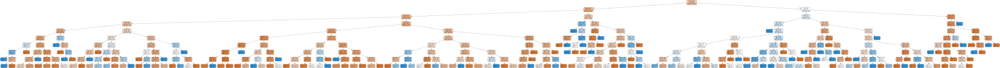

In [78]:
test  = TreeDP(complete, "Athletics", "Gold", 10)
test

# Aaccuracy of different Sports

In [27]:
test = GenerateAccuracyDF()
test

C:\Users\Gaurav\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.

C:\Users\Gaurav\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.

C:\Users\Gaurav\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.

C:\Users\Gaurav\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



,Sport,Gold Accuracy,Silver Accuracy,Bronze Accuracy
0,Basketball,83.50,79.00,79.00
1,Judo,71.70,66.04,51.89
2,Football,71.89,77.88,76.96
3,Tug-Of-War,100.00,100.00,100.00
4,Speed Skating,59.18,53.06,68.37
5,Cross Country Skiing,64.49,60.87,65.22
6,Athletics,63.97,64.93,65.75
7,Ice Hockey,78.54,65.13,74.71
8,Swimming,65.66,61.45,66.27
9,Badminton,51.61,58.06,64.52


## Test accuracy DataFrame Suggests variable accuracy levels for different sports
#### The Accuracy would depend on the corelation of the predictors with the medals
#### for example certain sports such as athletics, the predictors height and wieght might play an important role in medal analysis 

#### High degree of accuracy was achieved in sports such as "Basketball", because of the use of the predictor parameter "Team". "Basketball" is usually won by team "United States". Therfore due to the effect of the predictor "team" a high degree of accuracy was acheived. 

#### Extream accuarcy values for certain sports such as "Art competition" because these were old sports with limitted data to train and test on

### These Extream values are removed using the cleanexteam()

In [70]:
test = cleanextream(test)
test

,Sport,Gold Accuracy,Silver Accuracy,Bronze Accuracy
0,Basketball,83.50,79.00,79.50
1,Judo,72.64,64.15,50.94
2,Football,71.89,79.26,76.96
3,Speed Skating,60.20,53.06,68.37
4,Cross Country Skiing,64.49,63.77,64.49
5,Athletics,63.97,64.66,65.62
6,Ice Hockey,78.16,65.52,74.71
7,Swimming,65.26,61.24,66.06
8,Badminton,51.61,61.29,64.52
9,Sailing,64.71,58.09,65.44


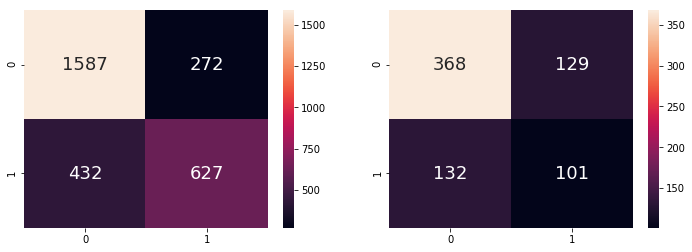

In [76]:
TreeHeat(df = complete, sport = "Athletics", thismedal = "Gold", depth = 10)  